In [5]:
import flask

app = flask.Flask(__name__)
app.config["DEBUG"] = True

@app.route('/', methods=['GET'])
def home():
    return "<h1>Hello Flask!</h1>"

app.run()

 * Serving Flask app '__main__'
 * Debug mode: on


 * Running on http://127.0.0.1:5000
Press CTRL+C to quit
 * Restarting with stat


SystemExit: 1

D:\python\dataScience\lib\site-packages\IPython\core\interactiveshell.py:3406: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [118]:
import matplotlib.pyplot as plt
import requests
import json
import cv2

image = cv2.imread('./dog.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image.shape, type(image)

((579, 750, 3), numpy.ndarray)

In [127]:
c, img_encoded = cv2.imencode('.png', image)
png_bytes = img_encoded.tobytes()
type(png_bytes)

bytes

In [122]:
img_encoded.shape, img_encoded

((666266,), array([137,  80,  78, ...,  66,  96, 130], dtype=uint8))

In [177]:
png_bytes.decode()

UnicodeDecodeError: 'utf-8' codec can't decode byte 0x89 in position 0: invalid start byte

In [189]:
png_bytes.decode(encoding='ISO-8859-1').encode(encoding='ISO-8859-1')

b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x02\xee\x00\x00\x02C\x08\x02\x00\x00\x00\xdb\xfd\x06\xad\x00\x00 \x00IDATx\x01\xa4\xc1]\x8f\xde\xe7~\x1d\xe6\xb5\xd6\xef~\x86\xe4P\xa2(\x89\xef\x12\x87/[\x1c\x853\x12%\xb7\xde@\xe3\xd8)\xd0\xd8A\x9c\xd6i\xd0\x83"I{\xd6\xc2\xfe6\xfd\n\xfd\nm\x83\xb6@\xd1\x93\x16nzP\x18\x06\x82\x84C\x0e%\r\xdfE\xf1eo\x92\x12I\xf1\xf9\xdf\xf7Z}f\xb6g\xfb\xe1\xa6\x92l\'\xd7E\xfc\x07\xf8\xe2\xf7\xfex\xa5\x1d\xf8\xff\xfe\xef\xff\t\xfb\xfe\xe0\x1f\xfc\xb7\xaf\xe7?\xda\x8e\xb3P+\xb3\xc4\x19\xae\xd2\x18\x99\xad4C\x1e\x1d@\xd5\xcc\x1eIDRr\xd2\xaa\x86G\x82\x92\xe2Q\xady\x9a&\xbb\xda\xac$\x80}z\xd5\xda\x0c\xc6|L\xadZ\xa8 \xadf1\x00\x92\xe8\xa3\xb7\x12\x00q6\xfcZU"\x1d\x90\xf1\x18\xd4,q\xab\x96\xd8\x03\x14\t\x06I\x06\xa9\xd6*\x0e\x90\xe1\x0eR\xac1\xd2Zc\x95{\x07\t\x18A\x9c6\x9b\xf5\xdeg\xb3\x95y\x9f\x88\xb4\x12\xa0\x00cL++\x07\xa6\xf9\xbc\xaa\x1c h\xb3F\xa9O\xf38\xa2\xaa\xd54M\x8e\xdbl\x96\x0ec\xa8\xb5\xc4\xb3\xd9\x81i\xfeZ\xc1@\xaaZ\x03\r\xb3jx\x14\xab{\xc4.i\xd8M\nY@\

In [192]:
png_bytes

b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x02\xee\x00\x00\x02C\x08\x02\x00\x00\x00\xdb\xfd\x06\xad\x00\x00 \x00IDATx\x01\xa4\xc1]\x8f\xde\xe7~\x1d\xe6\xb5\xd6\xef~\x86\xe4P\xa2(\x89\xef\x12\x87/[\x1c\x853\x12%\xb7\xde@\xe3\xd8)\xd0\xd8A\x9c\xd6i\xd0\x83"I{\xd6\xc2\xfe6\xfd\n\xfd\nm\x83\xb6@\xd1\x93\x16nzP\x18\x06\x82\x84C\x0e%\r\xdfE\xf1eo\x92\x12I\xf1\xf9\xdf\xf7Z}f\xb6g\xfb\xe1\xa6\x92l\'\xd7E\xfc\x07\xf8\xe2\xf7\xfex\xa5\x1d\xf8\xff\xfe\xef\xff\t\xfb\xfe\xe0\x1f\xfc\xb7\xaf\xe7?\xda\x8e\xb3P+\xb3\xc4\x19\xae\xd2\x18\x99\xad4C\x1e\x1d@\xd5\xcc\x1eIDRr\xd2\xaa\x86G\x82\x92\xe2Q\xady\x9a&\xbb\xda\xac$\x80}z\xd5\xda\x0c\xc6|L\xadZ\xa8 \xadf1\x00\x92\xe8\xa3\xb7\x12\x00q6\xfcZU"\x1d\x90\xf1\x18\xd4,q\xab\x96\xd8\x03\x14\t\x06I\x06\xa9\xd6*\x0e\x90\xe1\x0eR\xac1\xd2Zc\x95{\x07\t\x18A\x9c6\x9b\xf5\xdeg\xb3\x95y\x9f\x88\xb4\x12\xa0\x00cL++\x07\xa6\xf9\xbc\xaa\x1c h\xb3F\xa9O\xf38\xa2\xaa\xd54M\x8e\xdbl\x96\x0ec\xa8\xb5\xc4\xb3\xd9\x81i\xfeZ\xc1@\xaaZ\x03\r\xb3jx\x14\xab{\xc4.i\xd8M\nY@\

In [168]:
bytes(str(png_bytes), 'utf-8')

b'b\'\\x89PNG\\r\\n\\x1a\\n\\x00\\x00\\x00\\rIHDR\\x00\\x00\\x02\\xee\\x00\\x00\\x02C\\x08\\x02\\x00\\x00\\x00\\xdb\\xfd\\x06\\xad\\x00\\x00 \\x00IDATx\\x01\\xa4\\xc1]\\x8f\\xde\\xe7~\\x1d\\xe6\\xb5\\xd6\\xef~\\x86\\xe4P\\xa2(\\x89\\xef\\x12\\x87/[\\x1c\\x853\\x12%\\xb7\\xde@\\xe3\\xd8)\\xd0\\xd8A\\x9c\\xd6i\\xd0\\x83"I{\\xd6\\xc2\\xfe6\\xfd\\n\\xfd\\nm\\x83\\xb6@\\xd1\\x93\\x16nzP\\x18\\x06\\x82\\x84C\\x0e%\\r\\xdfE\\xf1eo\\x92\\x12I\\xf1\\xf9\\xdf\\xf7Z}f\\xb6g\\xfb\\xe1\\xa6\\x92l\\\'\\xd7E\\xfc\\x07\\xf8\\xe2\\xf7\\xfex\\xa5\\x1d\\xf8\\xff\\xfe\\xef\\xff\\t\\xfb\\xfe\\xe0\\x1f\\xfc\\xb7\\xaf\\xe7?\\xda\\x8e\\xb3P+\\xb3\\xc4\\x19\\xae\\xd2\\x18\\x99\\xad4C\\x1e\\x1d@\\xd5\\xcc\\x1eIDRr\\xd2\\xaa\\x86G\\x82\\x92\\xe2Q\\xady\\x9a&\\xbb\\xda\\xac$\\x80}z\\xd5\\xda\\x0c\\xc6|L\\xadZ\\xa8 \\xadf1\\x00\\x92\\xe8\\xa3\\xb7\\x12\\x00q6\\xfcZU"\\x1d\\x90\\xf1\\x18\\xd4,q\\xab\\x96\\xd8\\x03\\x14\\t\\x06I\\x06\\xa9\\xd6*\\x0e\\x90\\xe1\\x0eR\\xac1\\xd2Zc\\x95{\\x07\\t\\x18A\\x9c6\\x9b\\xf5\\x

In [143]:
bytes(x, 'utf-8')

b'\xef\xbf\xbdPNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x02\xef\xbf\xbd\x00\x00\x02C\x08\x02\x00\x00\x00\xef\xbf\xbd\xef\xbf\xbd\x06\xef\xbf\xbd\x00\x00 \x00IDATx\x01\xef\xbf\xbd\xef\xbf\xbd]\xef\xbf\xbd\xef\xbf\xbd\xef\xbf\xbd~\x1d\xef\xbf\xbd\xef\xbf\xbd\xef\xbf\xbd~\xef\xbf\xbd\xef\xbf\xbdP\xef\xbf\xbd(\xef\xbf\xbd\xef\xbf\xbd\x12\xef\xbf\xbd/[\x1c\xef\xbf\xbd3\x12%\xef\xbf\xbd\xef\xbf\xbd@\xef\xbf\xbd\xef\xbf\xbd)\xef\xbf\xbd\xef\xbf\xbdA\xef\xbf\xbd\xef\xbf\xbdi\xd0\x83"I{\xef\xbf\xbd\xef\xbf\xbd\xef\xbf\xbd6\xef\xbf\xbd\n\xef\xbf\xbd\nm\xef\xbf\xbd\xef\xbf\xbd@\xd1\x93\x16nzP\x18\x06\xef\xbf\xbd\xef\xbf\xbdC\x0e%\r\xef\xbf\xbdE\xef\xbf\xbdeo\xef\xbf\xbd\x12I\xef\xbf\xbd\xef\xbf\xbd\xef\xbf\xbd\xef\xbf\xbdZ}f\xef\xbf\xbdg\xef\xbf\xbd\xe1\xa6\x92l\'\xef\xbf\xbdE\xef\xbf\xbd\x07\xef\xbf\xbd\xef\xbf\xbd\xef\xbf\xbd\xef\xbf\xbdx\xef\xbf\xbd\x1d\xef\xbf\xbd\xef\xbf\xbd\xef\xbf\xbd\xef\xbf\xbd\xef\xbf\xbd\t\xef\xbf\xbd\xef\xbf\xbd\xef\xbf\xbd\x1f\xef\xbf\xbd\xef\xbf\xbd\xef\xbf\xbd\xef\xb

In [198]:
c1 = np.frombuffer(x, np.uint8)
img_frombyte = cv2.imdecode(c1, cv2.IMREAD_COLOR)
# type(img_frombyte)

In [200]:
img_frombyte.shape

(579, 750, 3)

In [125]:
# img_encoded.tobytes()

In [134]:
# byte to image
import numpy as np
c1 = np.frombuffer(png_bytes, np.uint8)
img_frombyte = cv2.imdecode(c1, cv2.IMREAD_COLOR)
type(img_frombyte)

numpy.ndarray

In [135]:
(img_frombyte == image).sum()

1302750

In [193]:
# print(r.text)
# print(r.json())
# data = {'image':png_bytes}
data = png_bytes
r = requests.post('http://192.168.10.81:20/predict', data=data)

In [196]:
x = r.json().encode('ISO-8859-1')
x

b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x02\xee\x00\x00\x02C\x08\x02\x00\x00\x00\xdb\xfd\x06\xad\x00\x00 \x00IDATx\x01\xa4\xc1]\x8f\xde\xe7~\x1d\xe6\xb5\xd6\xef~\x86\xe4P\xa2(\x89\xef\x12\x87/[\x1c\x853\x12%\xb7\xde@\xe3\xd8)\xd0\xd8A\x9c\xd6i\xd0\x83"I{\xd6\xc2\xfe6\xfd\n\xfd\nm\x83\xb6@\xd1\x93\x16nzP\x18\x06\x82\x84C\x0e%\r\xdfE\xf1eo\x92\x12I\xf1\xf9\xdf\xf7Z}f\xb6g\xfb\xe1\xa6\x92l\'\xd7E\xfc\x07\xf8\xe2\xf7\xfex\xa5\x1d\xf8\xff\xfe\xef\xff\t\xfb\xfe\xe0\x1f\xfc\xb7\xaf\xe7?\xda\x8e\xb3P+\xb3\xc4\x19\xae\xd2\x18\x99\xad4C\x1e\x1d@\xd5\xcc\x1eIDRr\xd2\xaa\x86G\x82\x92\xe2Q\xady\x9a&\xbb\xda\xac$\x80}z\xd5\xda\x0c\xc6|L\xadZ\xa8 \xadf1\x00\x92\xe8\xa3\xb7\x12\x00q6\xfcZU"\x1d\x90\xf1\x18\xd4,q\xab\x96\xd8\x03\x14\t\x06I\x06\xa9\xd6*\x0e\x90\xe1\x0eR\xac1\xd2Zc\x95{\x07\t\x18A\x9c6\x9b\xf5\xdeg\xb3\x95y\x9f\x88\xb4\x12\xa0\x00cL++\x07\xa6\xf9\xbc\xaa\x1c h\xb3F\xa9O\xf38\xa2\xaa\xd54M\x8e\xdbl\x96\x0ec\xa8\xb5\xc4\xb3\xd9\x81i\xfeZ\xc1@\xaaZ\x03\r\xb3jx\x14\xab{\xc4.i\xd8M\nY@\

In [163]:
print(r.text)

<!doctype html>
<html lang=en>
  <head>
    <title>TypeError: The view function for 'country' did not return a valid response. The function either returned None or ended without a return statement.
 // Werkzeug Debugger</title>
    <link rel="stylesheet" href="?__debugger__=yes&amp;cmd=resource&amp;f=style.css">
    <link rel="shortcut icon"
        href="?__debugger__=yes&amp;cmd=resource&amp;f=console.png">
    <script src="?__debugger__=yes&amp;cmd=resource&amp;f=debugger.js"></script>
    <script>
      var CONSOLE_MODE = false,
          EVALEX = true,
          EVALEX_TRUSTED = false,
          SECRET = "KFPXAYub16dBAUcUZ4pb";
    </script>
  </head>
  <body style="background-color: #fff">
    <div class="debugger">
<h1>TypeError</h1>
<div class="detail">
  <p class="errormsg">TypeError: The view function for &#39;country&#39; did not return a valid response. The function either returned None or ended without a return statement.
</p>
</div>
<h2 class="traceback">Traceback <em>(mo

In [153]:
x = r.json()
# c2 = np.fromstring(x, np.uint8)
# img_frombyte = cv2.imdecode(c2, cv2.IMREAD_COLOR)

JSONDecodeError: Expecting value: line 1 column 1 (char 0)

In [154]:
print(r.text)

Traceback (most recent call last):
  File "D:\study\justLearn\forwork\learn_flask\try2.py", line 19, in country
    return jsonify(png_bytes)
  File "D:\python\dataScience\lib\site-packages\flask\json\__init__.py", line 342, in jsonify
    return current_app.json.response(*args, **kwargs)
  File "D:\python\dataScience\lib\site-packages\flask\json\provider.py", line 309, in response
    f"{self.dumps(obj, **dump_args)}\n", mimetype=mimetype
  File "D:\python\dataScience\lib\site-packages\flask\json\provider.py", line 230, in dumps
    return json.dumps(obj, **kwargs)
  File "D:\python\lib\json\__init__.py", line 238, in dumps
    **kw).encode(obj)
  File "D:\python\lib\json\encoder.py", line 201, in encode
    chunks = list(chunks)
  File "D:\python\lib\json\encoder.py", line 438, in _iterencode
    o = _default(o)
  File "D:\python\dataScience\lib\site-packages\flask\json\provider.py", line 122, in _default
    raise TypeError(f"Object of type {type(o).__name__} is not JSON serializabl

In [97]:
c2 = np.fromstring(x.encode(), np.uint8)

C:\Users\Beefnoodle\AppData\Local\Temp\ipykernel_17012\1066322897.py:1: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  c2 = np.fromstring(x.encode(), np.uint8)


In [101]:
img_frombyte = cv2.imdecode(c2, cv2.IMREAD_COLOR)
img_frombyte, c2.shape

(None, (1209253,))

In [91]:
c2.shape

(1209253,)

In [90]:
c1.shape

(666266,)

In [83]:
with open('./dog.png', 'rb') as f:
    c = f.read()

In [125]:
import numpy as np
import cv2

c2 = np.frombuffer(bytes(c.encode()), np.uint8)
c3 = cv2.imdecode(c2, cv2.IMREAD_COLOR)

In [126]:
c3

In [107]:
k = bytearray(c.encode())
k = cv2.imdecode(k, cv2.IMREAD_COLOR)

error: OpenCV(4.6.0) :-1: error: (-5:Bad argument) in function 'imdecode'
> Overload resolution failed:
>  - buf is not a numpy array, neither a scalar
>  - Expected Ptr<cv::UMat> for argument 'buf'


In [115]:
np.frombuffer(bytearray(c.encoding), dtype=np.uint8)

AttributeError: 'str' object has no attribute 'encoding'

In [93]:
nparr.shape

(1130224,)

In [96]:
579 * 750 * 3

1302750

In [95]:
image.shape

(579, 750, 3)

In [76]:
import numpy as np
cc = np.frombuffer(str.encode(c), dtype=np.uint8)

In [78]:
cc.shape

(1130224,)

In [39]:
print(r.text)

{}



In [80]:
579 * 750 * 3

1302750

In [79]:
image.shape

(579, 750, 3)

In [28]:
print(r.text)

Traceback (most recent call last):
  File "D:\study\justLearn\forwork\learn_flask\try2.py", line 16, in country
    data = {'s':a}
NameError: name 'a' is not defined



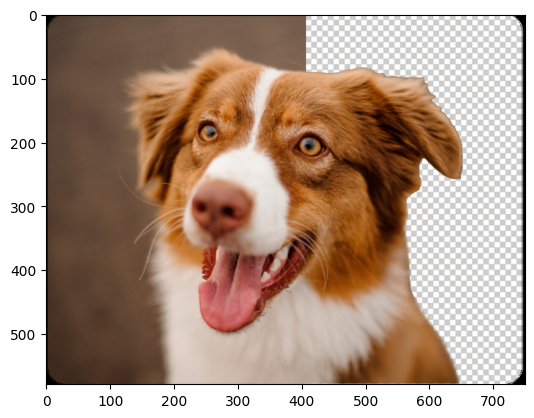

In [65]:
plt.imshow(image)

In [7]:
# r.text

In [21]:
# r.json()

In [23]:
import traceback
import sys

try:
    do_stuff()
except Exception:
    c = traceback.format_exc()

In [25]:
print(c)

Traceback (most recent call last):
  File "C:\Users\Beefnoodle\AppData\Local\Temp\ipykernel_19352\1361618599.py", line 5, in <cell line: 4>
    do_stuff()
NameError: name 'do_stuff' is not defined

